<a href="https://colab.research.google.com/github/Nikhil5566/EDA-Repo/blob/main/Concrete_Compressive_Strength_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concrete Compressive Strength Dataset

# About the dataset and Insight

Dataset provides a fascinating look into the factors influencing the compressive strength of concrete. It's quite robust, containing 1030 entries, each describing a unique concrete mixture and its resulting strength. Each entry is characterized by 14 different features, including the quantities of essential components like cement, slag, ash, water, superplasticizer, coarse aggregate, and fine aggregate, alongside the concrete's age when tested. The ultimate goal here is to predict the 'strength' of the concrete, which is our primary target variable.

From our initial exploration, we observed that all features are numerical, which simplifies the data processing. While there were no missing values—a great start for any analysis—we did identify 25 duplicate entries, which might need to be addressed to ensure accurate modeling. The distributions of individual components like cement, water, and age vary, with some showing more symmetrical patterns and others exhibiting skewness, suggesting diverse mixture compositions and testing conditions.

Crucially, when examining the relationships between these components and the concrete's strength, we found some compelling insights. As expected, cement content, superplasticizer dosage, and the age of the concrete generally show a positive correlation with its compressive strength. This aligns with engineering principles, as more cement typically means stronger concrete, superplasticizers improve workability without adding water (thus maintaining strength), and concrete gains strength over time. Conversely, a higher water content or water_cement_ratio tends to be negatively correlated with strength, reinforcing the understanding that excess water weakens concrete. Engineered features like total_binder, cement_water_interaction, and age_strength_proxy also demonstrate strong relationships, highlighting their potential as powerful predictors. These initial findings lay a solid foundation for building a predictive model for concrete compressive strength.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d ahmeduzaki/concrete-compressive-strength-dataset

# Unziping the downloaded file
!unzip concrete-compressive-strength-dataset.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/ahmeduzaki/concrete-compressive-strength-dataset
License(s): CC0-1.0
  0% 0.00/32.2k [00:00<?, ?B/s]
100% 32.2k/32.2k [00:00<00:00, 116MB/s]
Archive:  concrete-compressive-strength-dataset.zip
  inflating: Concrete Compressive Strength.csv  


In [3]:
df = pd.read_csv('Concrete Compressive Strength.csv')
df.head(11)

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength,water_cement_ratio,total_binder,aggregate_to_cement,cement_water_interaction,age_strength_proxy
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89,1.440188,353.3,12.174719,28754.55,5.291503
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51,0.937235,335.4,11.113019,26736.87,3.741657
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22,0.749597,345.7,7.272371,46850.00,5.291503
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85,0.857140,380.0,6.022534,60648.00,5.291503
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29,1.248700,338.2,11.266723,29922.84,5.291503
5,255.0,0.0,0.0,192.0,0.0,889.8,945.0,90,21.86,0.752938,255.0,7.195266,48960.00,9.486833
6,166.8,250.2,0.0,203.5,0.0,975.6,692.6,7,15.75,1.220017,417.0,10.001139,33943.80,2.645751
7,251.4,0.0,118.3,188.5,6.4,1028.4,757.7,56,36.64,0.749798,369.7,7.104586,47388.90,7.483315
8,296.0,0.0,0.0,192.0,0.0,1085.0,765.0,28,21.65,0.648646,296.0,6.249979,56832.00,5.291503
9,155.0,184.0,143.0,194.0,9.0,880.0,699.0,28,28.99,1.251605,482.0,10.187031,30070.00,5.291503


In [4]:
df.tail(11)

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength,water_cement_ratio,total_binder,aggregate_to_cement,cement_water_interaction,age_strength_proxy
1019,288.0,192.0,0.0,192.0,0.0,932.0,717.8,7,23.52,0.666664,480.0,5.728452,55296.00,2.645751
1020,183.9,122.6,0.0,203.5,0.0,959.2,800.0,7,10.79,1.106574,306.5,9.566016,37423.65,2.645751
1021,203.5,305.3,0.0,203.5,0.0,963.4,630.0,3,9.56,0.999995,508.8,7.829937,41412.25,1.732051
1022,144.8,0.0,133.6,180.8,11.1,979.5,811.5,28,13.20,1.248610,278.4,12.368699,26179.84,5.291503
1023,141.3,212.0,0.0,203.5,0.0,971.8,748.5,7,10.39,1.440188,353.3,12.174719,28754.55,2.645751
1024,297.2,0.0,117.5,174.8,9.5,1022.8,753.5,3,21.91,0.588154,414.7,5.976763,51950.56,1.732051
1025,135.0,0.0,166.0,180.0,10.0,961.0,805.0,28,13.29,1.333323,301.0,13.081385,24300.00,5.291503
1026,531.3,0.0,0.0,141.8,28.2,852.1,893.7,3,41.30,0.266892,531.3,3.285896,75338.34,1.732051
1027,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28,0.649781,482.7,5.927620,49641.44,5.291503
1028,342.0,38.0,0.0,228.0,0.0,932.0,670.0,270,55.06,0.666665,380.0,4.684197,77976.00,16.431677


In [5]:
df.shape

(1030, 14)

In [6]:
df.columns

Index(['cement', 'slag', 'ash', 'water', 'superplastic', 'coarseagg',
       'fineagg', 'age', 'strength', 'water_cement_ratio', 'total_binder',
       'aggregate_to_cement', 'cement_water_interaction',
       'age_strength_proxy'],
      dtype='object')

In [7]:
df.dtypes

,0
cement,float64
slag,float64
ash,float64
water,float64
superplastic,float64
coarseagg,float64
fineagg,float64
age,int64
strength,float64
water_cement_ratio,float64


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   cement                    1030 non-null   float64
 1   slag                      1030 non-null   float64
 2   ash                       1030 non-null   float64
 3   water                     1030 non-null   float64
 4   superplastic              1030 non-null   float64
 5   coarseagg                 1030 non-null   float64
 6   fineagg                   1030 non-null   float64
 7   age                       1030 non-null   int64  
 8   strength                  1030 non-null   float64
 9   water_cement_ratio        1030 non-null   float64
 10  total_binder              1030 non-null   float64
 11  aggregate_to_cement       1030 non-null   float64
 12  cement_water_interaction  1030 non-null   float64
 13  age_strength_proxy        1030 non-null   float64
dtypes: float

In [9]:
df.describe(include = 'all').T

,count,mean,std,min,25%,50%,75%,max
cement,1030.0,281.167864,104.506364,102.000000,192.375000,272.900000,350.000000,540.000000
slag,1030.0,73.895825,86.279342,0.000000,0.000000,22.000000,142.950000,359.400000
ash,1030.0,54.188350,63.997004,0.000000,0.000000,0.000000,118.300000,200.100000
water,1030.0,181.567282,21.354219,121.800000,164.900000,185.000000,192.000000,247.000000
superplastic,1030.0,6.204660,5.973841,0.000000,0.000000,6.400000,10.200000,32.200000
coarseagg,1030.0,972.918932,77.753954,801.000000,932.000000,968.000000,1029.400000,1145.000000
fineagg,1030.0,773.580485,80.175980,594.000000,730.950000,779.500000,824.000000,992.600000
age,1030.0,45.662136,63.169912,1.000000,7.000000,28.000000,56.000000,365.000000
strength,1030.0,35.817961,16.705742,2.330000,23.710000,34.445000,46.135000,82.600000
water_cement_ratio,1030.0,0.748263,0.314003,0.266892,0.533332,0.675346,0.935160,1.882334


In [10]:
df.isnull().sum()

,0
cement,0
slag,0
ash,0
water,0
superplastic,0
coarseagg,0
fineagg,0
age,0
strength,0
water_cement_ratio,0


In [11]:
df.duplicated().sum()

np.int64(25)

# Univariate Analysis

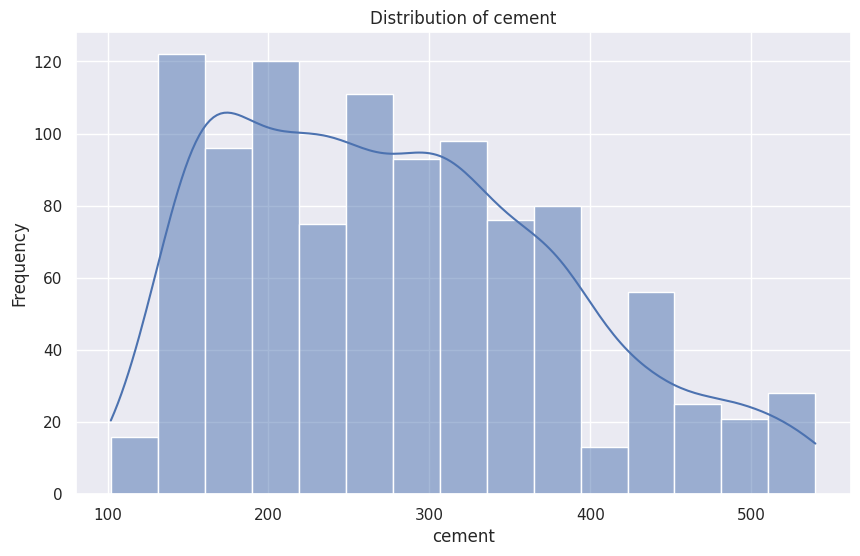

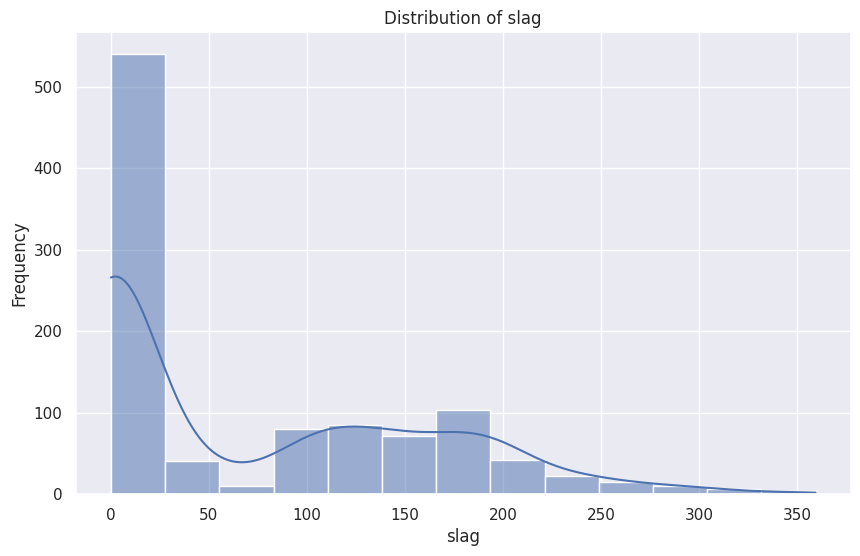

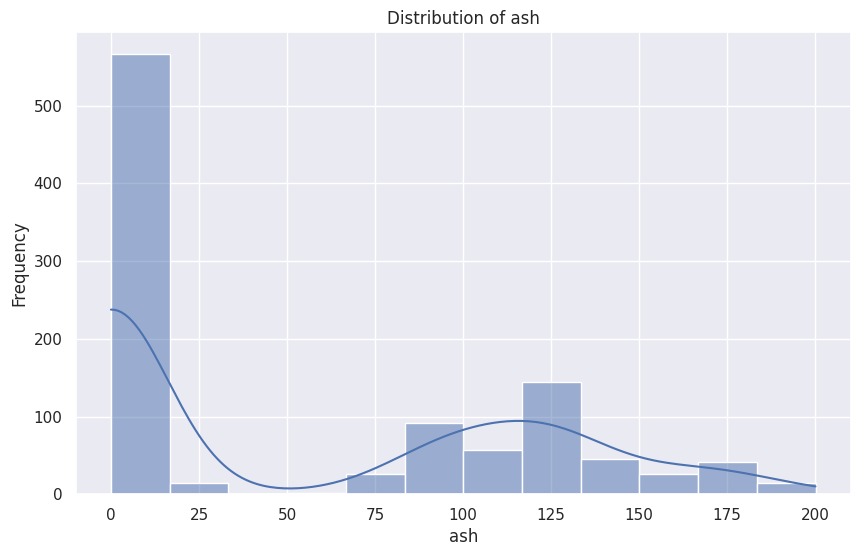

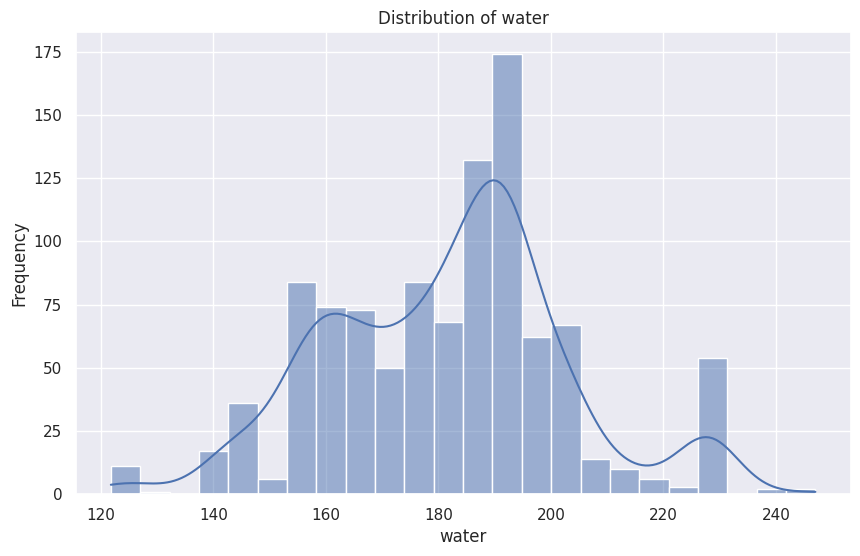

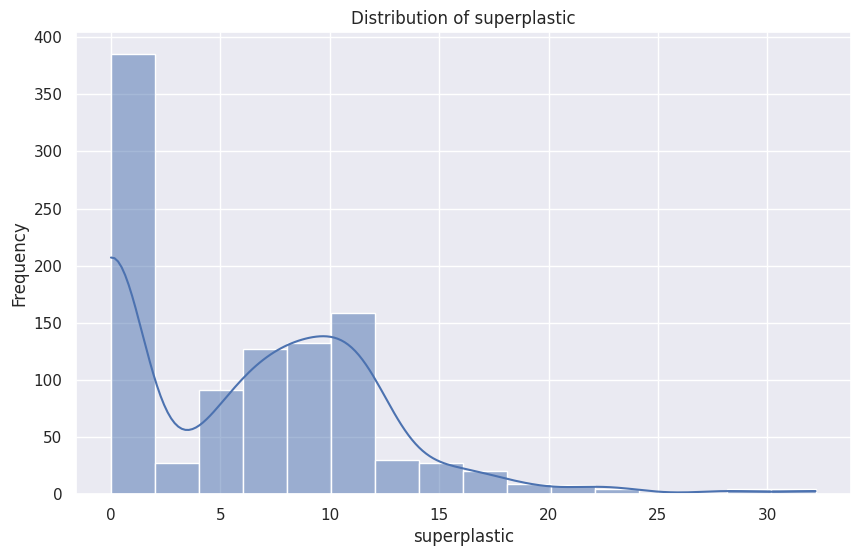

...

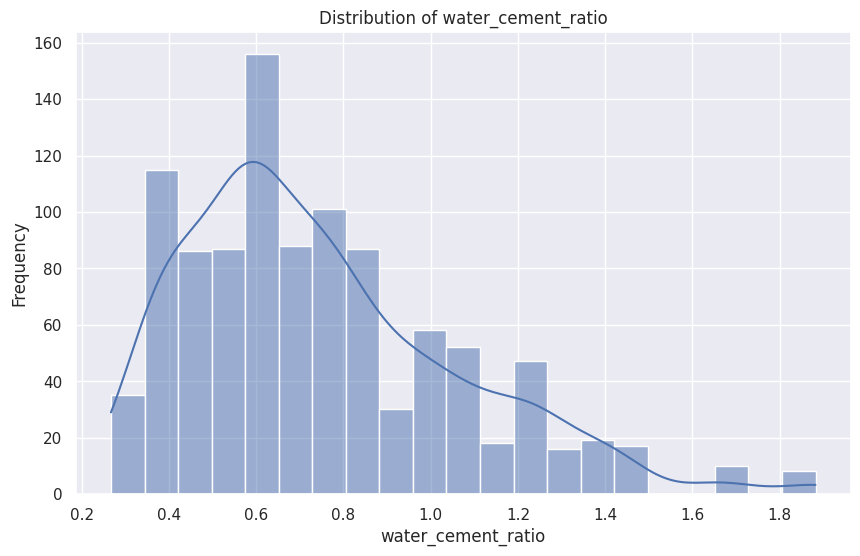

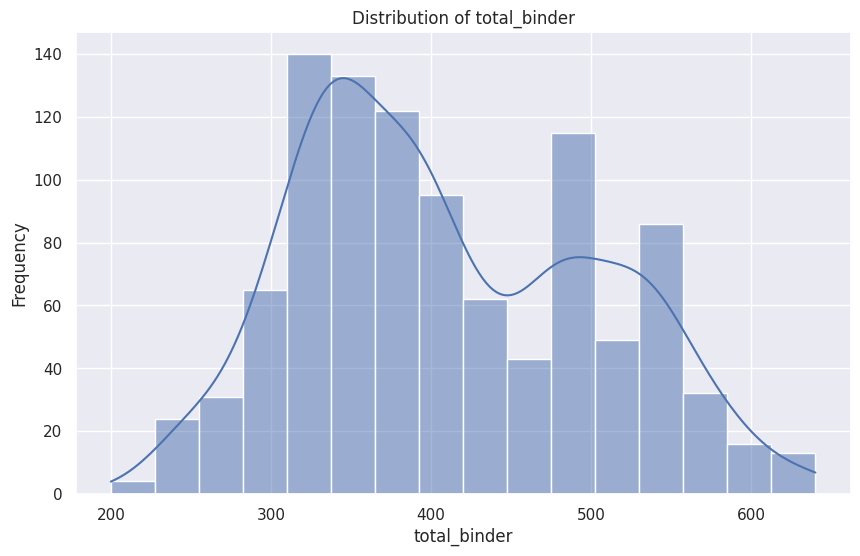

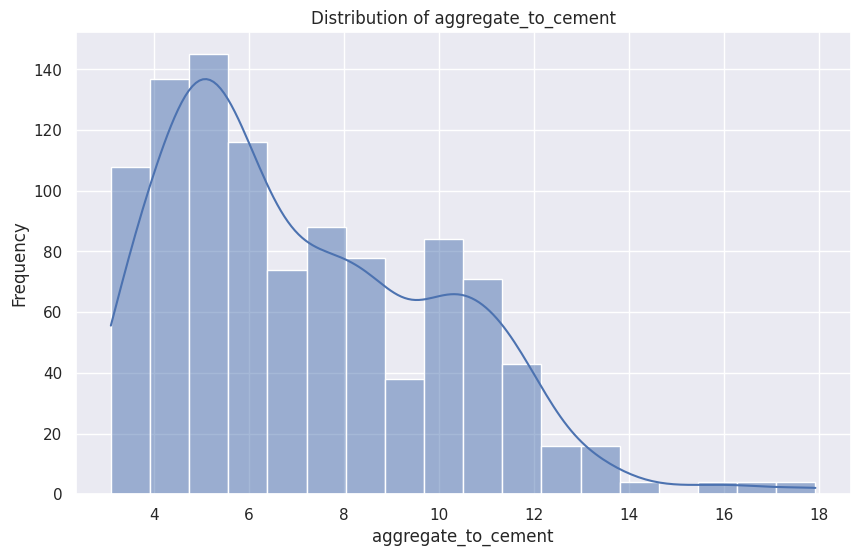

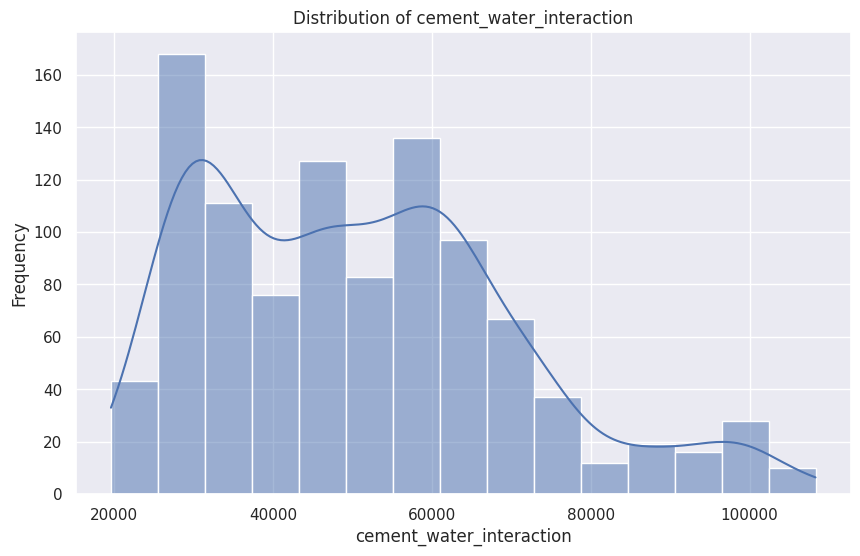

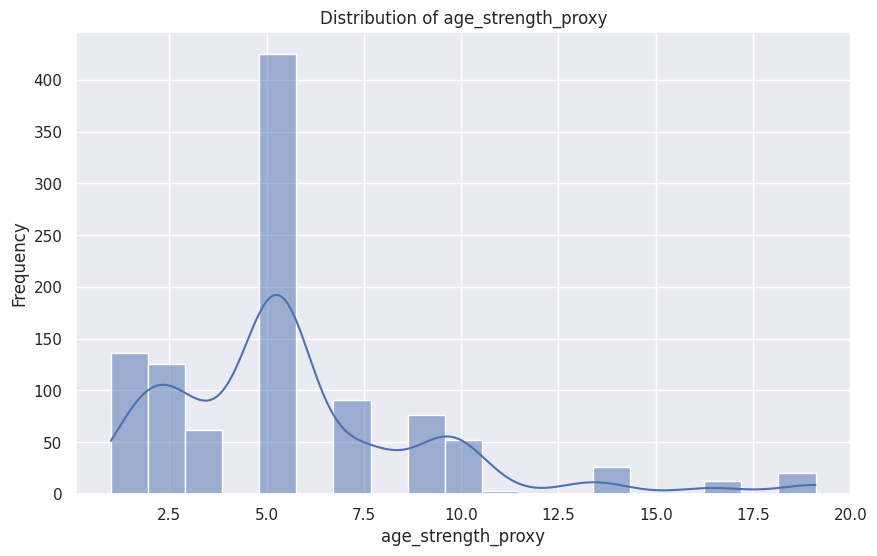

In [12]:
# Getting a list of numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterating through numerical columns and create histograms
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Getting a list of categorical columns
categorical_cols = df.select_dtypes(include='object').columns.tolist()

# Iterate through categorical columns and create countplots
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# We can also use value_counts for a quick look at categorical data distribution
for col in categorical_cols:
    print(f"Value counts for {col}:\n{df[col].value_counts()}\n")

# Bivariate Analysis

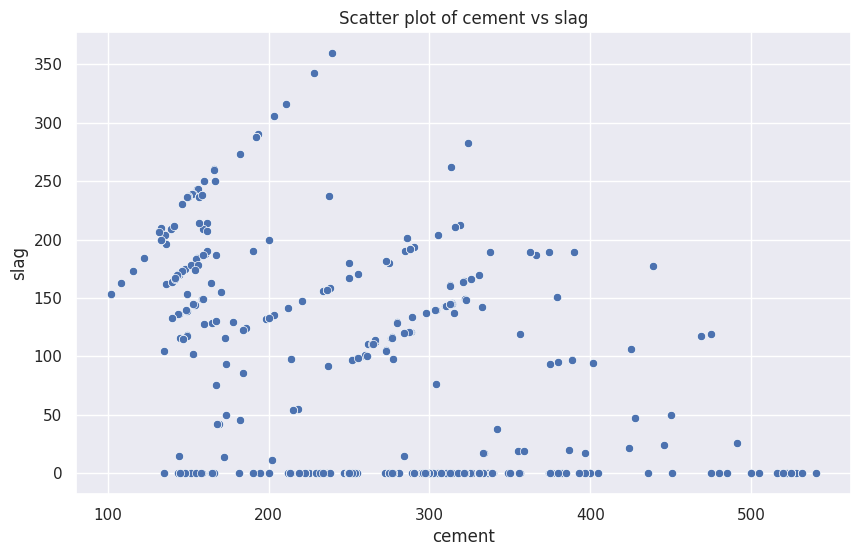

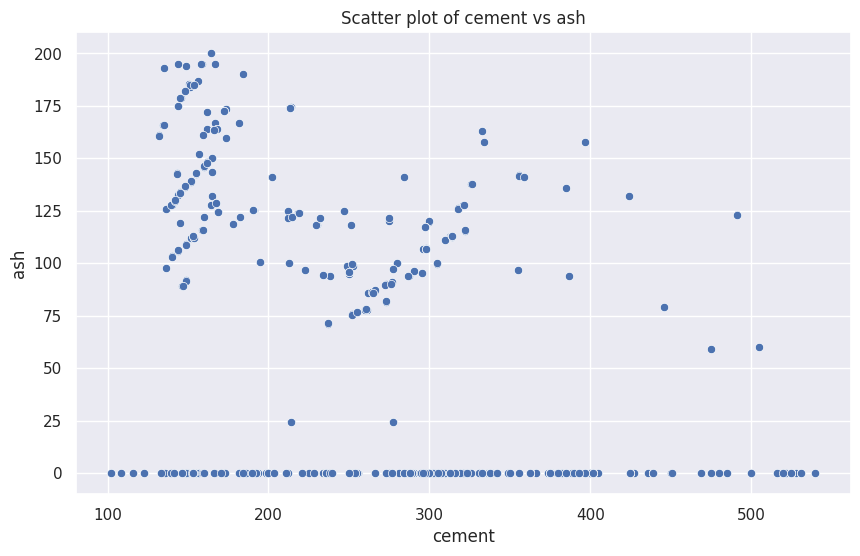

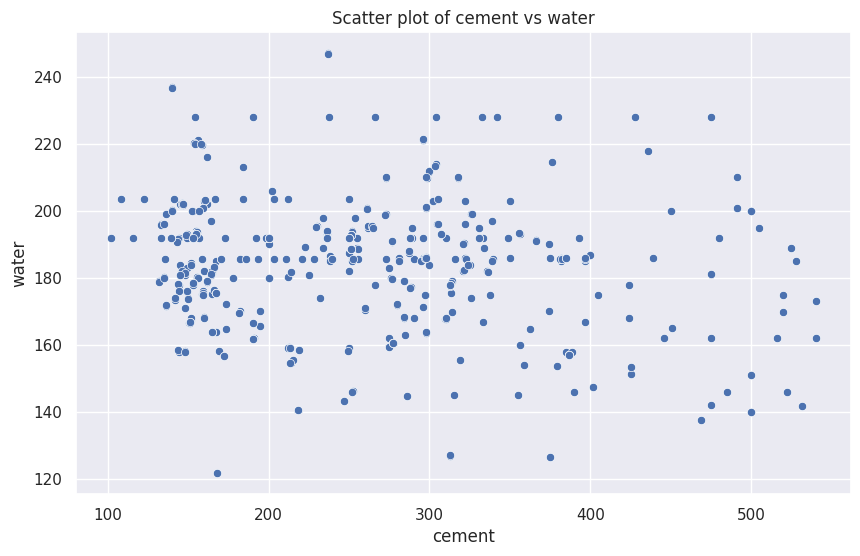

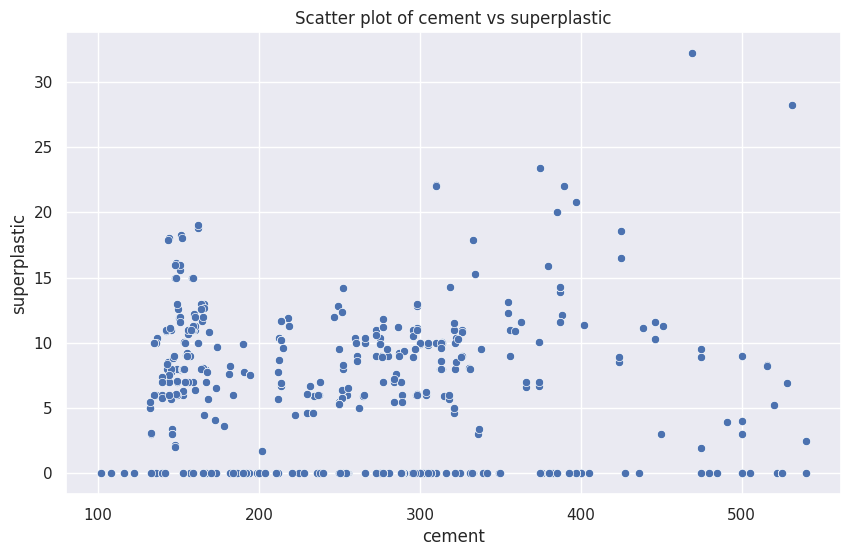

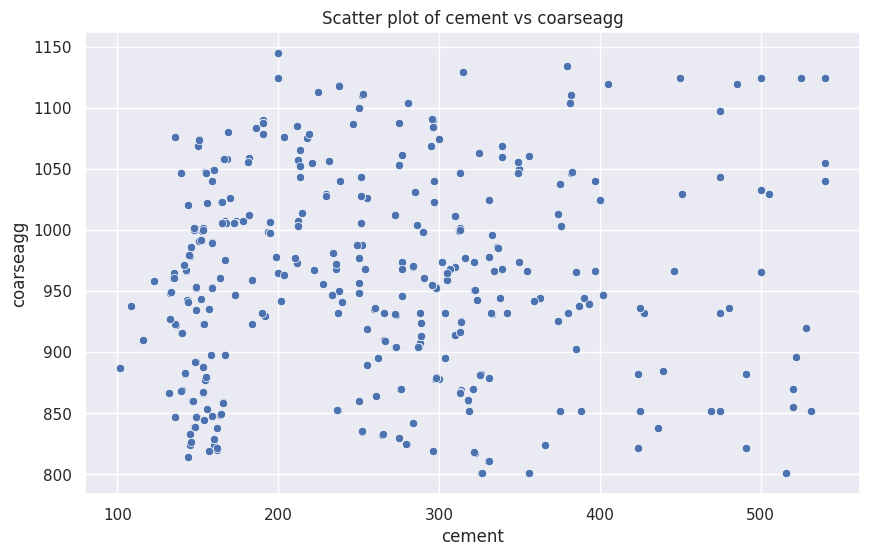

...

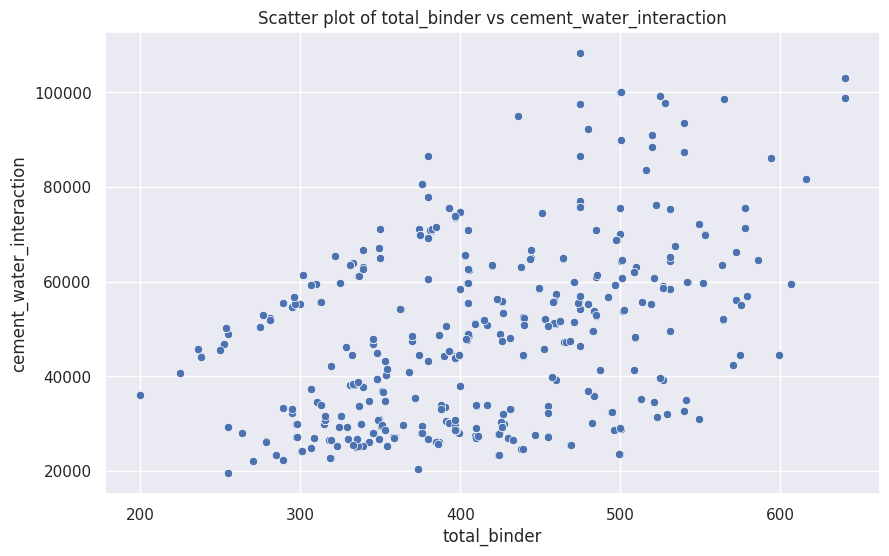

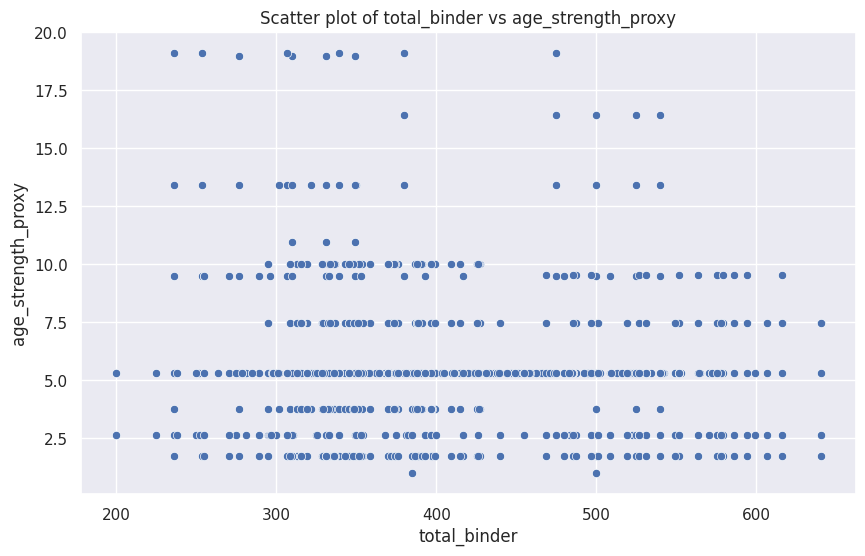

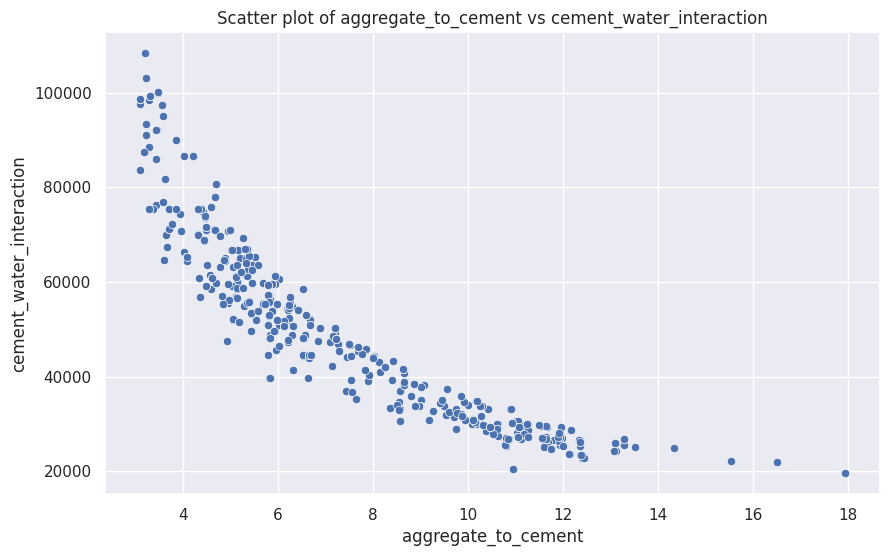

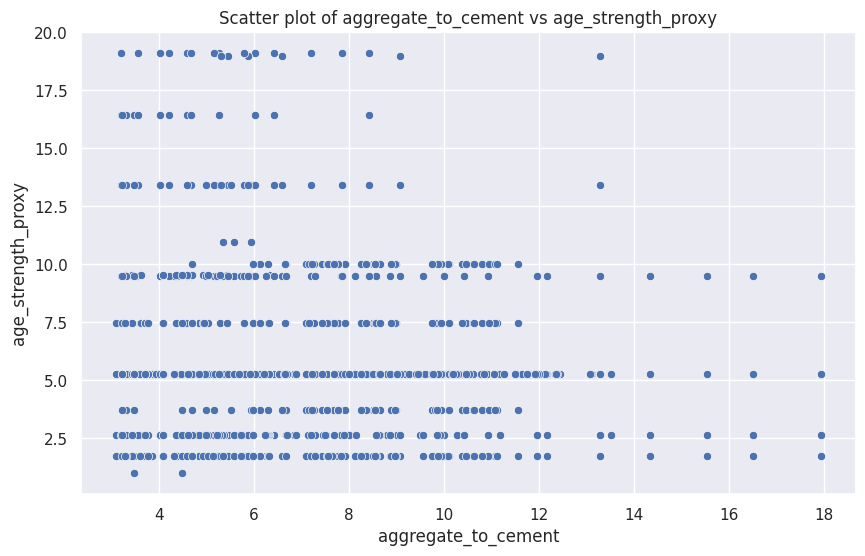

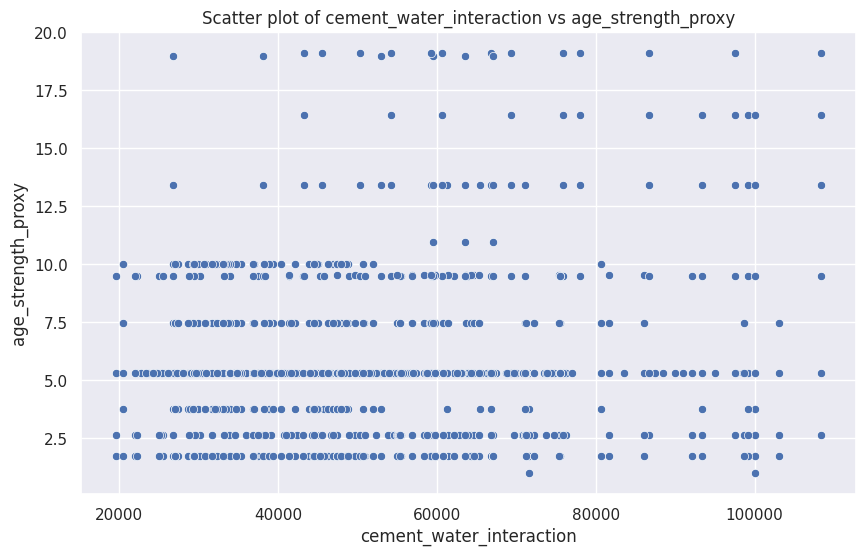

In [13]:
# Numerical-Numerical relationships (Scatter plots)
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through pairs of numerical columns and create scatter plots
for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        col1 = numerical_cols[i]
        col2 = numerical_cols[j]
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=df, x=col1, y=col2)
        plt.title(f'Scatter plot of {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.show()

# Categorical-Numerical relationships (Box plots)
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through categorical and numerical columns and create box plots
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=df, x=cat_col, y=num_col)
        plt.title(f'Box plot of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

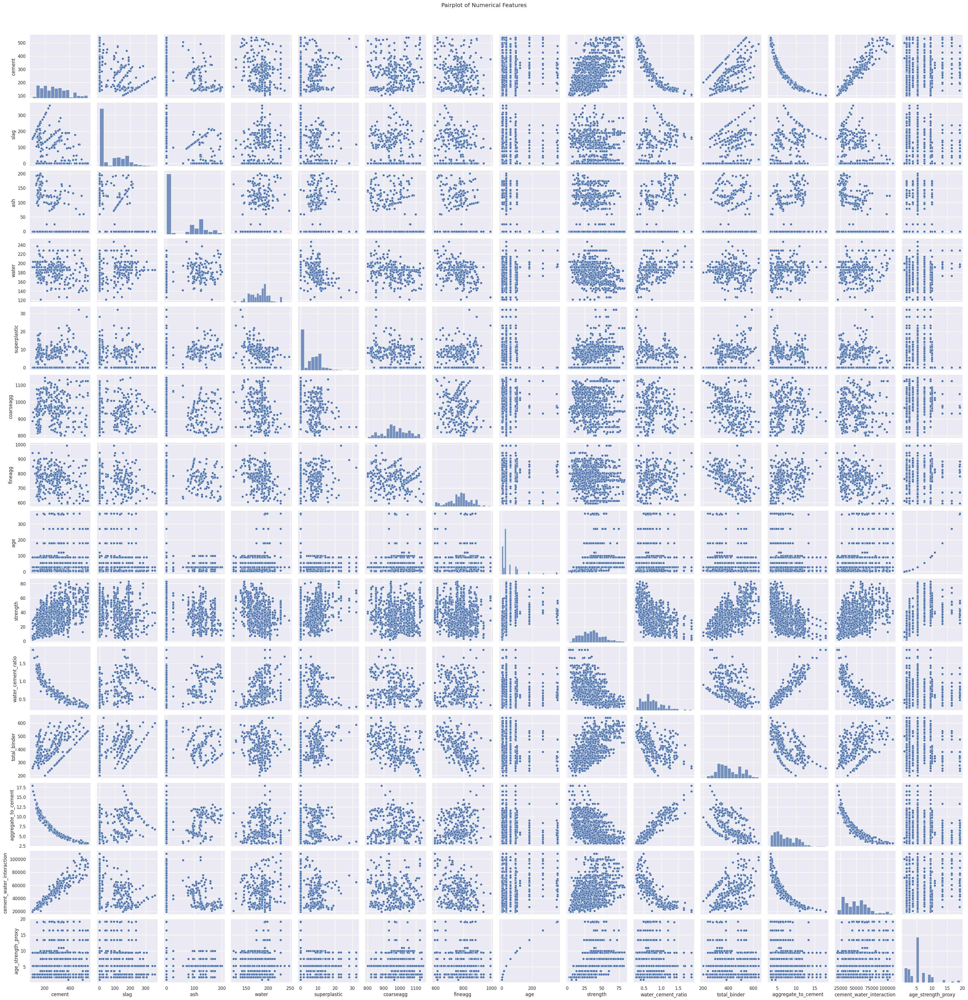

In [14]:
sns.pairplot(df.select_dtypes(include=np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

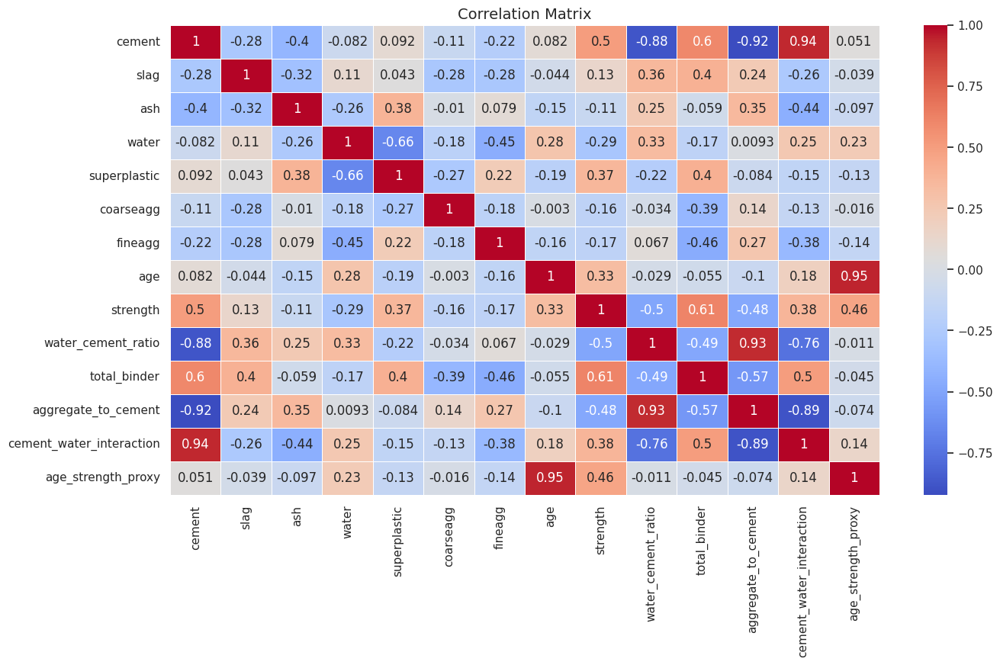

In [15]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Thank You